In [4]:
import os

folder_path = r'GPM_3IMERGHH_07-20250618_112842'
print(os.path.exists(folder_path))
print(os.listdir(folder_path)[:5])  # Should print first 5 files


True
['3B-HHR.MS.MRG.3IMERG.20201011-S000000-E002959.0000.V07B.HDF5', '3B-HHR.MS.MRG.3IMERG.20201011-S003000-E005959.0030.V07B.HDF5', '3B-HHR.MS.MRG.3IMERG.20201011-S010000-E012959.0060.V07B.HDF5', '3B-HHR.MS.MRG.3IMERG.20201011-S013000-E015959.0090.V07B.HDF5', '3B-HHR.MS.MRG.3IMERG.20201011-S020000-E022959.0120.V07B.HDF5']


In [6]:
import h5py

file_path = r'GPM_3IMERGHH_07-20250618_112842/3B-HHR.MS.MRG.3IMERG.20201011-S000000-E002959.0000.V07B.HDF5'
with h5py.File(file_path, 'r') as f:
    def print_structure(name, obj):
        print(name)
    f.visititems(print_structure)


Grid
Grid/Intermediate
Grid/Intermediate/IRinfluence
Grid/Intermediate/IRprecipitation
Grid/Intermediate/MWobservationTime
Grid/Intermediate/MWprecipSource
Grid/Intermediate/MWprecipitation
Grid/Intermediate/precipitationUncal
Grid/lat
Grid/lat_bnds
Grid/latv
Grid/lon
Grid/lon_bnds
Grid/lonv
Grid/nv
Grid/precipitation
Grid/precipitationQualityIndex
Grid/probabilityLiquidPrecipitation
Grid/randomError
Grid/time
Grid/time_bnds


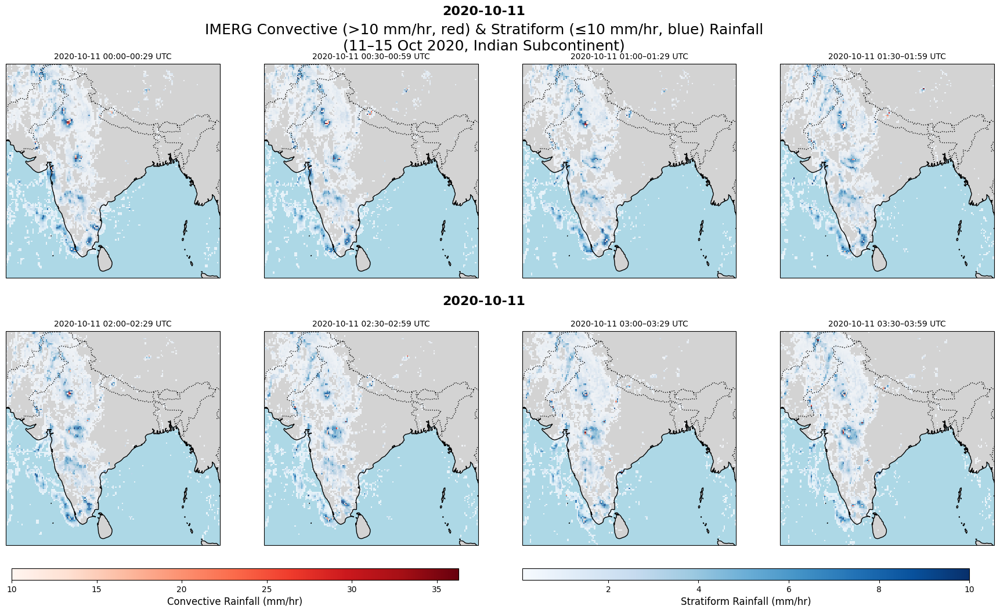

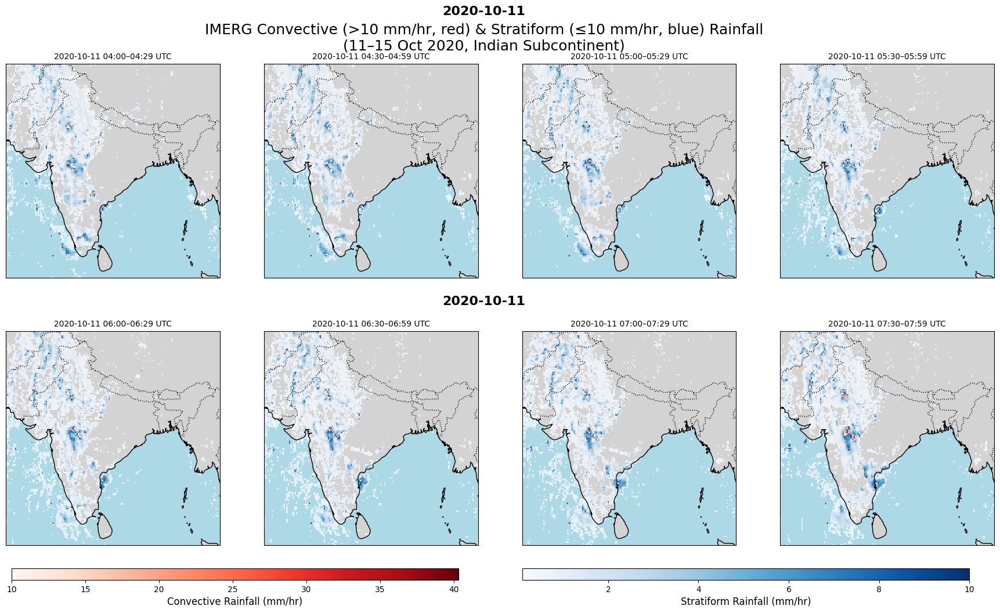

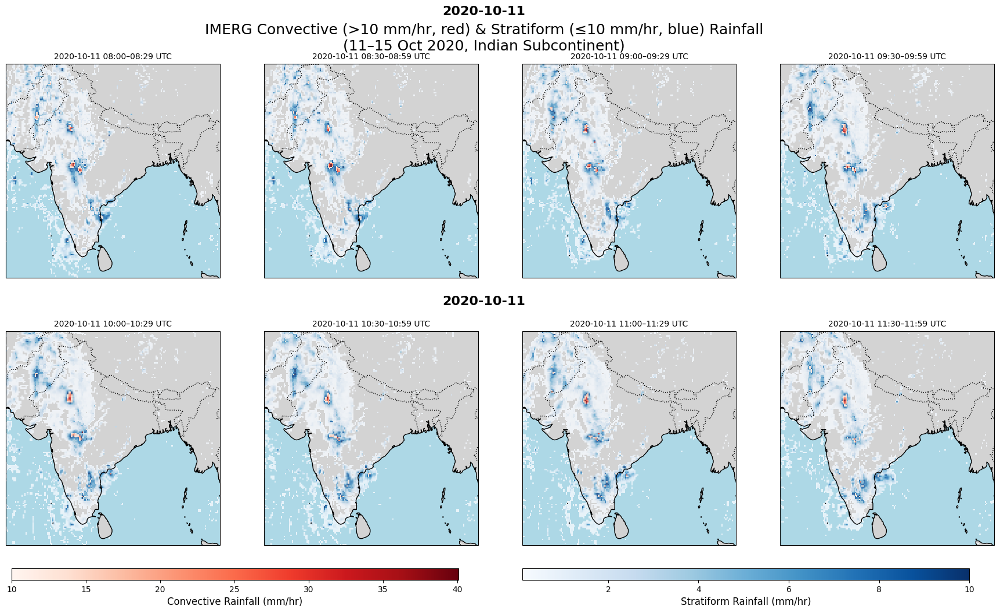

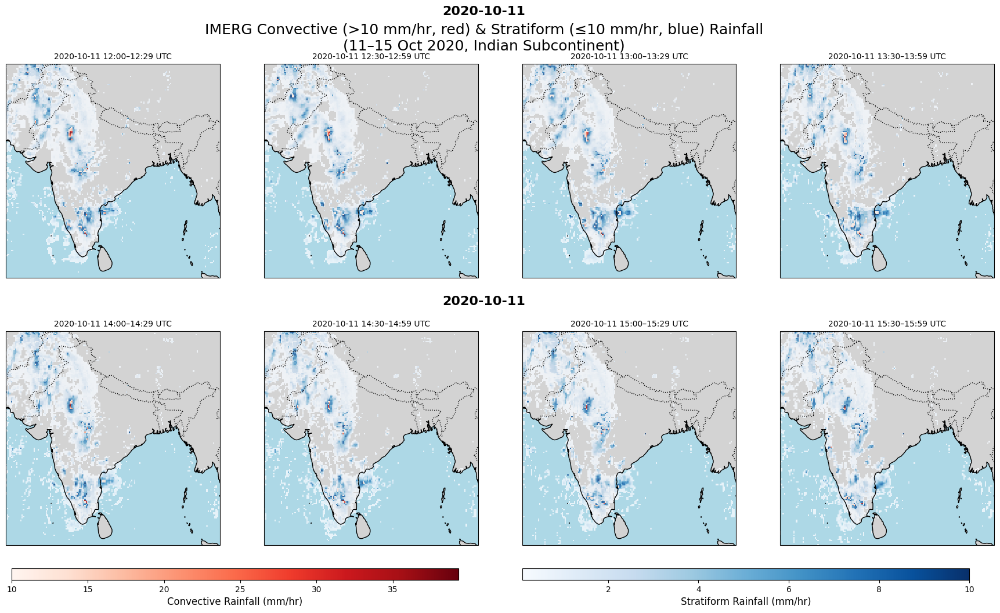

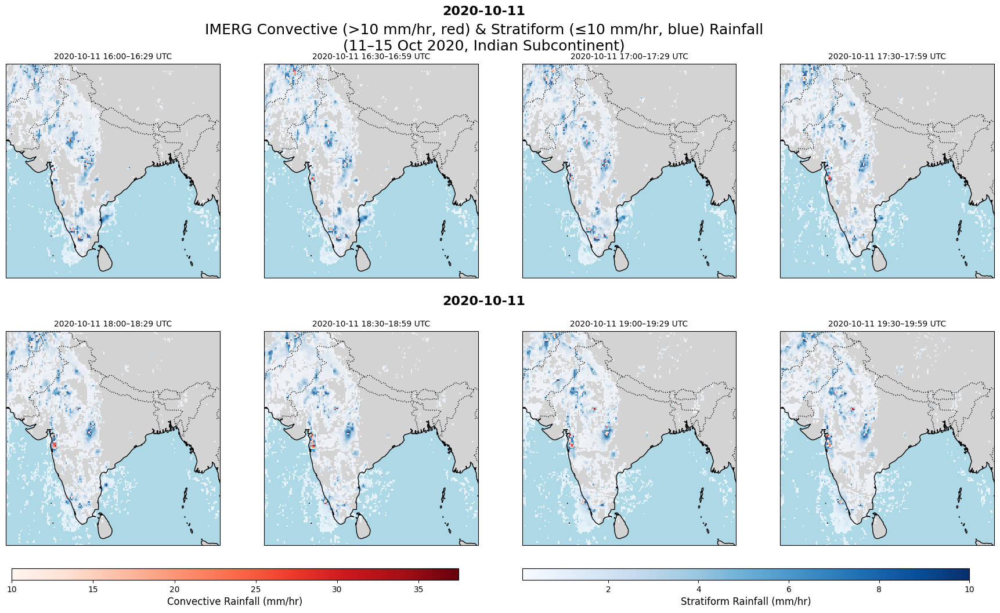

...

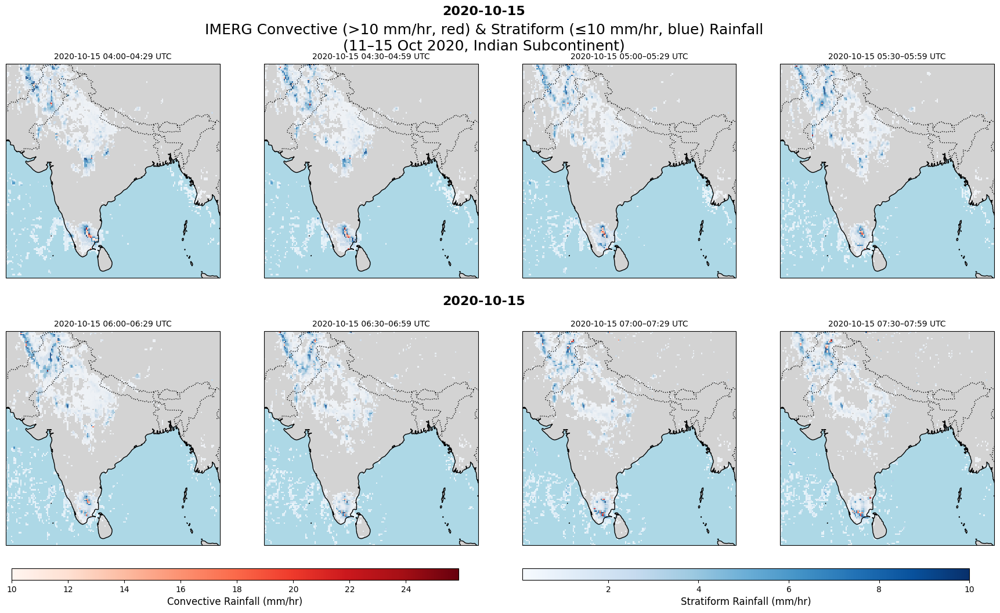

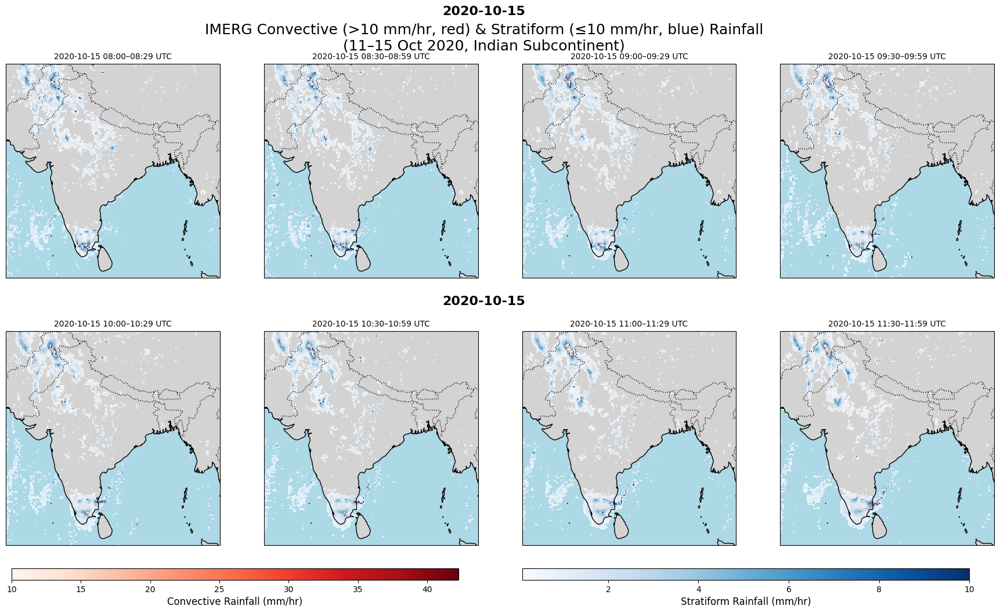

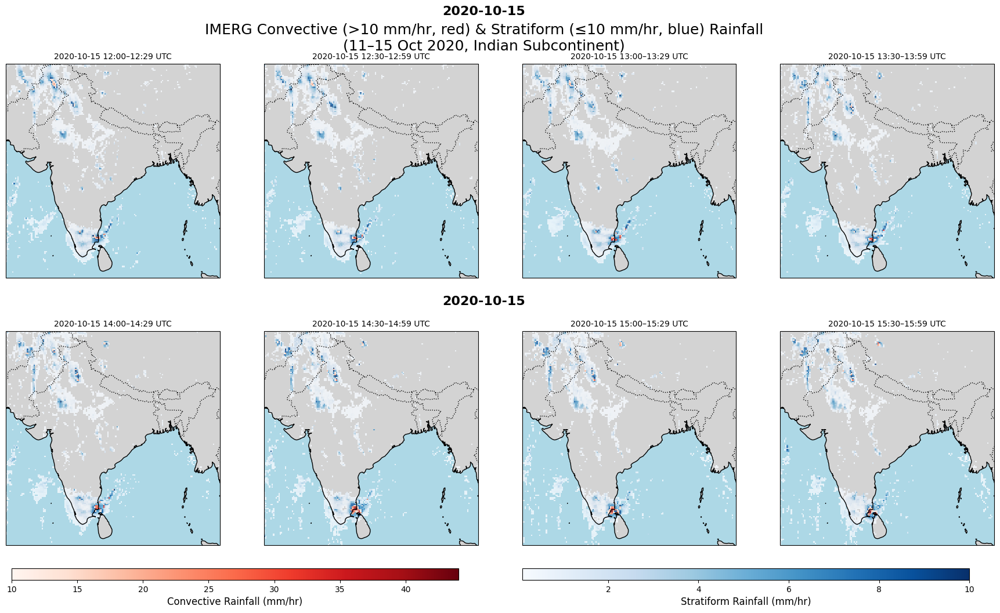

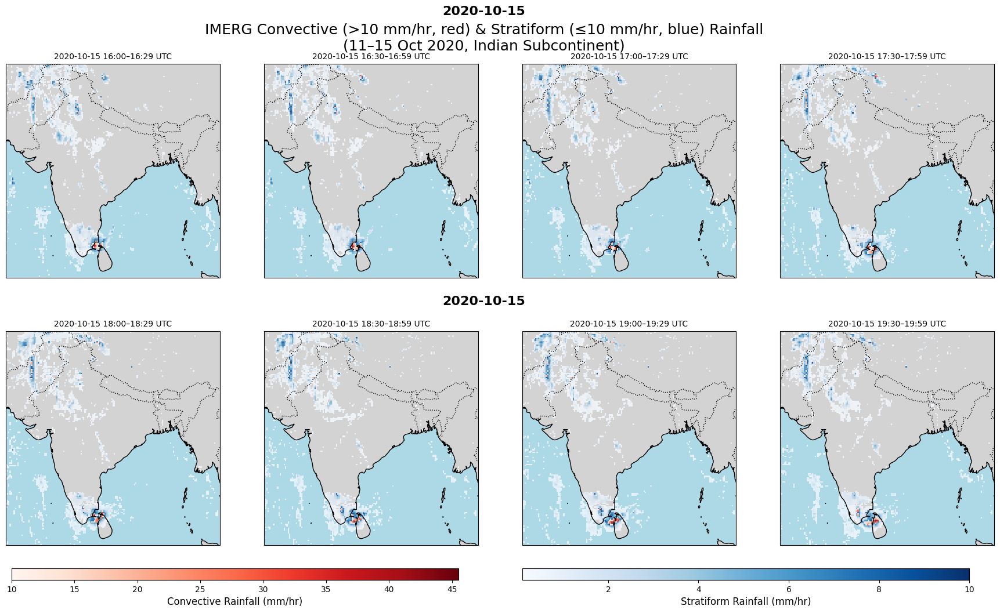

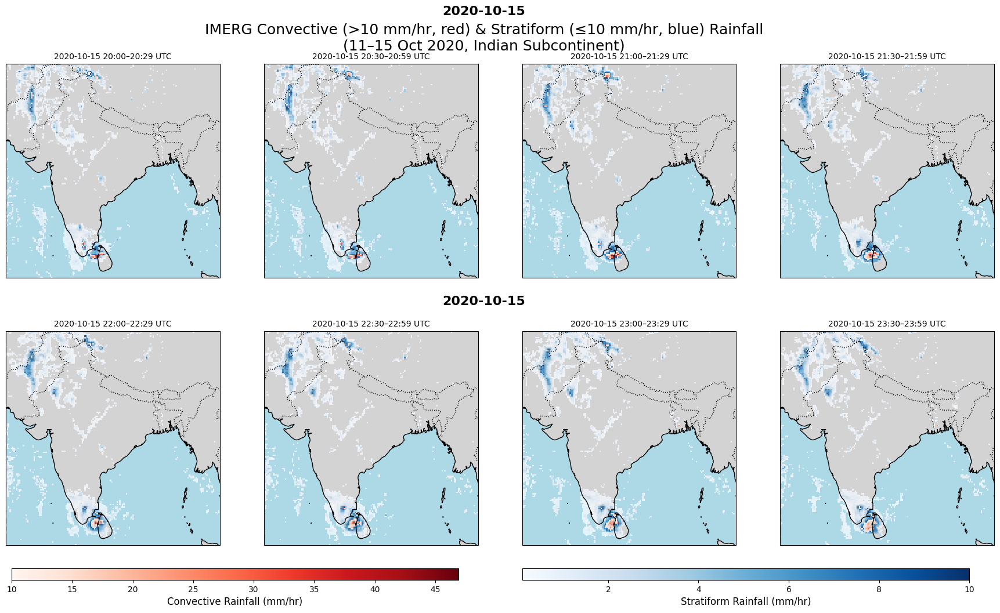

In [16]:
import h5py
import numpy as np
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import glob
import os

# SETTINGS
folder_path = r'GPM_3IMERGHH_07-20250618_112842'
days = range(11, 16)  # 11 to 15 Oct 2020
convective_threshold = 10.0  # mm/hr
stratiform_upper = 10.0      # mm/hr

cols = 4
batch_size = 8  # 2 rows of 4 per page (adjust as needed)
downsample = 2  # Use every 2nd grid point for plotting

# Gather all files and their dates
all_files = []
all_dates = []
for day in days:
    date_str = f'202010{day:02d}'
    pattern = os.path.join(folder_path, f'3B-HHR.MS.MRG.3IMERG.{date_str}-S*.HDF5')
    file_list = sorted(glob.glob(pattern))
    all_files.extend(file_list)
    all_dates.extend([f'{date_str[:4]}-{date_str[4:6]}-{date_str[6:]}' for _ in file_list])

num_files = len(all_files)

for batch_start in range(0, num_files, batch_size):
    batch_files = all_files[batch_start:batch_start+batch_size]
    batch_dates = all_dates[batch_start:batch_start+batch_size]
    batch_n = len(batch_files)
    batch_rows = (batch_n + cols - 1) // cols

    fig, axes = plt.subplots(batch_rows, cols, figsize=(22, 5*batch_rows), subplot_kw={'projection': ccrs.PlateCarree()})
    axes = axes.flatten()
    all_conv = []
    all_strat = []
    row_dates = [None] * batch_rows

    for i, (file_path, frame_date) in enumerate(zip(batch_files, batch_dates)):
        try:
            with h5py.File(file_path, 'r') as f:
                precip = f['Grid/precipitation'][:]
                precip = np.squeeze(precip)
                lats = f['Grid/lat'][:]
                lons = f['Grid/lon'][:]
        except Exception as e:
            print(f"Error reading {file_path}: {e}")
            continue

        lat_mask = (lats >= 5) & (lats <= 37)
        lon_mask = (lons >= 66) & (lons <= 98)
        if precip.shape == (len(lons), len(lats)):
            precip_sub = precip[lon_mask, :][:, lat_mask]
            lons_sub = lons[lon_mask]
            lats_sub = lats[lat_mask]
        else:
            precip_sub = precip[lat_mask, :][:, lon_mask]
            lats_sub = lats[lat_mask]
            lons_sub = lons[lon_mask]

        # Downsample for plotting
        precip_sub = precip_sub[::downsample, ::downsample]
        lats_sub = lats_sub[::downsample]
        lons_sub = lons_sub[::downsample]

        conv_mask = precip_sub > convective_threshold
        strat_mask = (precip_sub > 0) & (precip_sub <= stratiform_upper)
        convective = np.where(conv_mask, precip_sub, np.nan)
        stratiform = np.where(strat_mask, precip_sub, np.nan)
        all_conv.append(convective)
        all_strat.append(stratiform)

        ax = axes[i]
        ax.set_extent([66, 98, 5, 37], crs=ccrs.PlateCarree())
        ax.add_feature(cfeature.COASTLINE)
        ax.add_feature(cfeature.BORDERS, linestyle=':')
        ax.add_feature(cfeature.LAND, facecolor='lightgray')
        ax.add_feature(cfeature.OCEAN, facecolor='lightblue')

        mesh_strat = ax.pcolormesh(
            lons_sub, lats_sub, stratiform,
            cmap='Blues', vmin=0.1, vmax=stratiform_upper, shading='auto', alpha=0.8, transform=ccrs.PlateCarree()
        )
        mesh_conv = ax.pcolormesh(
            lons_sub, lats_sub, convective,
            cmap='Reds', vmin=convective_threshold,
            vmax=np.nanmax(convective) if np.any(~np.isnan(convective)) else convective_threshold+1,
            shading='auto', alpha=0.8, transform=ccrs.PlateCarree()
        )

        # Title with time
        fname = os.path.basename(file_path)
        try:
            start_time = fname.split('-S')[1].split('-E')[0]
            end_time = fname.split('-E')[1].split('.')[0]
            display_time = f"{frame_date} {start_time[:2]}:{start_time[2:4]}–{end_time[:2]}:{end_time[2:4]} UTC"
        except Exception:
            display_time = frame_date
        ax.set_title(display_time, fontsize=10)

        # Add date label only once per row (centered above the row)
        row_idx = i // cols
        if row_dates[row_idx] is None:
            ypos = 1 - (row_idx / batch_rows) + 0.01  # Adjust as needed
            fig.text(0.5, ypos, frame_date, ha='center', va='bottom', fontsize=16, fontweight='bold')
            row_dates[row_idx] = frame_date

    # Remove empty subplots
    for j in range(i+1, len(axes)):
        fig.delaxes(axes[j])

    # Add horizontal colorbars at the bottom
    conv_vmax = np.nanmax([np.nanmax(c) for c in all_conv if np.any(~np.isnan(c))])
    strat_vmax = stratiform_upper

    cbar_ax1 = fig.add_axes([0.13, 0.04, 0.35, 0.02])  # [left, bottom, width, height]
    cbar_ax2 = fig.add_axes([0.53, 0.04, 0.35, 0.02])
    cb1 = fig.colorbar(
        plt.cm.ScalarMappable(cmap='Reds', norm=plt.Normalize(convective_threshold, conv_vmax)),
        cax=cbar_ax1, orientation='horizontal'
    )
    cb1.set_label('Convective Rainfall (mm/hr)', fontsize=12)
    cb2 = fig.colorbar(
        plt.cm.ScalarMappable(cmap='Blues', norm=plt.Normalize(0.1, strat_vmax)),
        cax=cbar_ax2, orientation='horizontal'
    )
    cb2.set_label('Stratiform Rainfall (mm/hr)', fontsize=12)

    plt.subplots_adjust(top=0.93, bottom=0.10, hspace=0.25)
    plt.suptitle('IMERG Convective (>10 mm/hr, red) & Stratiform (≤10 mm/hr, blue) Rainfall\n(11–15 Oct 2020, Indian Subcontinent)', fontsize=18, y=1.00)
    plt.show()
    plt.close(fig)  # Free memory after each batch
